<a href="https://colab.research.google.com/github/rinogrego/KDU-CV/blob/main/Tugas-3/Generative-Adversarial-Networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dataset: Fundus Images

Source:
- [FIVES: A Fundus Image Dataset for Artificial Intelligence based Vessel Segmentation](https://www.nature.com/articles/s41597-022-01564-3)

In [ ]:
!unrar x '/content/drive/MyDrive/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation.rar' '/content/datasets/'


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation.rar

Creating    /content/datasets                                         OK
Creating    /content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation  OK
Extracting  /content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/Quality Assessment.xlsx       0%  OK 
Creating    /content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test  OK
Creating    /content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test/Ground truth  OK
Extracting  /content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test/Ground truth/100_D.png       0%  OK 
Extracting  /content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test/Ground truth/101_G.png       0%  OK 


In [ ]:
import pandas as pd

df_qa = pd.read_excel("/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/Quality Assessment.xlsx", index_col=[0])
df_qa.head()

,Number,IC,Blur,LC
Disease,,,,
A,1,1,1,1
A,2,1,1,1
A,3,1,1,1
A,4,1,1,1
A,5,1,1,1


In [ ]:
df_qa.info()

<class 'pandas.core.frame.DataFrame'>
Index: 600 entries, A to N
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Number  600 non-null    int64
 1   IC      600 non-null    int64
 2   Blur    600 non-null    int64
 3   LC      600 non-null    int64
dtypes: int64(4)
memory usage: 23.4+ KB


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os
import glob
import random
import numpy as np

In [ ]:
TRAIN_PATH = "/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train"
TEST_PATH = "/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test"

### Random Trivia

Opening image via `PIL` and `cv2` libraries

In [ ]:
# useless code just to test
image_path = "/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/103_A.png"

# Load the image using opencv
img = cv2.imread(image_path) # numpy
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Load the image using PIL
image = Image.open(image_path).convert("RGB") #.convert("RGB") not really needed but just to make sure
image = np.asarray(image)

# test both methods (will fail if cv2 image not RGB converted)
assert (type(image) == type(img))
np.testing.assert_equal(image, img)
np.testing.assert_array_almost_equal(image, img)
np.testing.assert_array_equal(image, img)

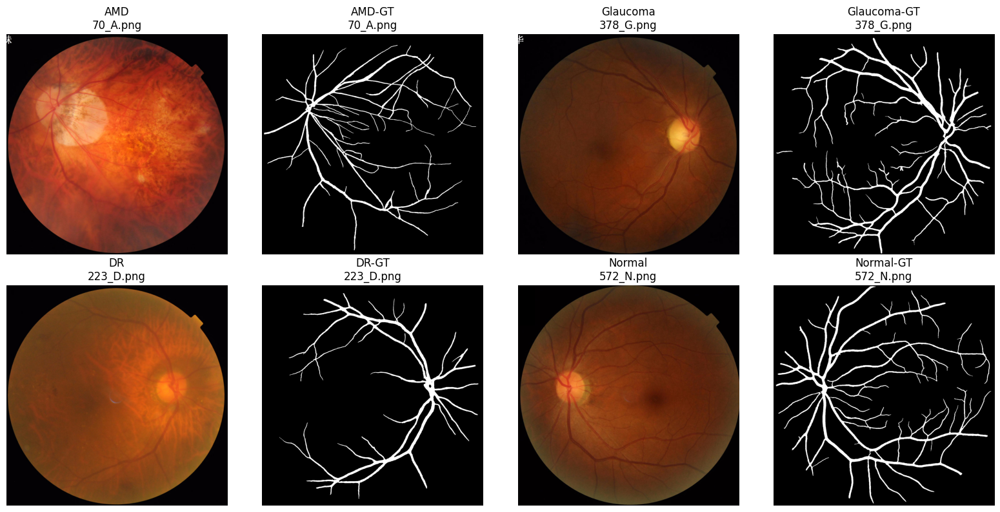

In [ ]:
AMD_files = glob.glob(os.path.join(TRAIN_PATH, "Original", "*_A.png"))
Glaucoma_files = glob.glob(os.path.join(TRAIN_PATH, "Original", "*_G.png"))
DR_files = glob.glob(os.path.join(TRAIN_PATH, "Original", "*_D.png"))
Normal_files = glob.glob(os.path.join(TRAIN_PATH, "Original", "*_N.png"))

# Choose a random image for each disease
AMD_filename = random.choice(AMD_files)
Glaucoma_filename = random.choice(Glaucoma_files)
DR_filename = random.choice(DR_files)
Normal_filename = random.choice(Normal_files)


# take its corresponding ground truth label
AMD_GT_filename = AMD_filename.replace("Original", "Ground truth")
Glaucoma_GT_filename = Glaucoma_filename.replace("Original", "Ground truth")
DR_GT_filename = DR_filename.replace("Original", "Ground truth")
Normal_GT_filename = Normal_filename.replace("Original", "Ground truth")

plt.figure(figsize=(16, 8))
for idx, (image_path, label) in enumerate([
    (AMD_filename, "AMD"),
    (AMD_GT_filename, "AMD-GT"),
    (Glaucoma_filename, "Glaucoma"),
    (Glaucoma_GT_filename, "Glaucoma-GT"),
    (DR_filename, "DR"),
    (DR_GT_filename, "DR-GT"),
    (Normal_filename, "Normal"),
    (Normal_GT_filename, "Normal-GT"),
]):
    width = 4
    height = 2
    plt.subplot(height, width, idx+1)
    image = Image.open(image_path).convert("RGB")
    image = np.asarray(image)
    plt.imshow(image)
    filename = image_path.split("/")[-1]
    plt.title("%s\n%s" % (label, filename), fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()

### Configure Data Loader

from the paper:

"Pictures were saved in PNG format with a resolution of `2048 × 2048 pixels`. No image compression was conducted during the image capturing, annotation and dataset uploading processes"

In [ ]:
glob.glob("/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/*.png")

['/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/11_A.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/120_A.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/397_G.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/582_N.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/350_G.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/517_N.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/215_D.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/10_A.png',
 '/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original/429_G.png',
 '/content/datasets/F

In [ ]:
len(glob.glob("/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/*/Original/*.png"))

800

In [ ]:
# check resolution consistency

err_found = False
for image_path in glob.glob("/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/*/Original/*.png"):
    _img = Image.open(image_path).convert('RGB')
    _img = np.asarray(_img)
    if _img.shape != (2048, 2048, 3):
        err_found = True
        print(image_path)

if err_found:
    print("the paper is not consistent because there is an image with resolution not equal to 2048x2048x3")
else:
    print("image with resolution not equal to (2048, 2048, 3) is not found")
    print("the paper is correct")

image with resolution not equal to (2048, 2048, 3) is not found
the paper is correct


In [ ]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class CustomDataset(Dataset):
    def __init__(
        self,
        data_dir,
        transform: transforms.Compose | None = None,
        num_rows: int = None
    ):
        self.data_dir = data_dir
        if num_rows != None:
            self.data_df = self.data_df.sample(num_rows)
        self.transform = transform

    def __len__(self):
        return len(glob.glob(os.path.join(self.data_dir, "*.png")))

    def __getitem__(self, idx):
        image_path = glob.glob(os.path.join(self.data_dir, "*.png"))[idx]
        image = Image.open(image_path).convert('RGB')
        filename = image_path.split("/")[-1]
        if "A" in filename:
            label = [1, 0, 0, 0]
        elif "G":
            label = [0, 1, 0, 0]
        elif "D":
            label = [0, 0, 1, 0]
        elif "N":
            label = [0, 0, 0, 1]
        else:
            label = [0, 0, 0, 0]
        if self.transform:
            image = self.transform(image)
        return image, np.array(label, dtype=np.float32)

train_dataset = CustomDataset(
    data_dir = "/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original",
    transform = transforms.Compose([
        transforms.Resize((360, 360)),
        transforms.CenterCrop(360),
        transforms.transforms.ToTensor(),
        transforms.transforms.Normalize(
            mean=[0.5, 0.5, 0.5],           # mean=[0.485, 0.456, 0.406],
            std=[0.5, 0.5, 0.5],            # std=[0.229, 0.224, 0.225],
        )
    ]),
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)

In [ ]:
_train_batch = next(train_loader.__iter__())
# inspect shapes
_train_batch[0].shape, _train_batch[1].shape

(torch.Size([32, 3, 360, 360]), torch.Size([32, 4]))

In [ ]:
test_dataset = CustomDataset(
    data_dir = "/content/datasets/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test/Original",
    transform = transforms.Compose([
        transforms.Resize((360, 360)),
        transforms.transforms.ToTensor(),
    ]),
)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

In [ ]:
_test_batch = next(test_loader.__iter__())
# inspect shapes
_test_batch[0].shape, _test_batch[1].shape

(torch.Size([32, 3, 360, 360]), torch.Size([32, 4]))

In [ ]:
len(train_loader), len(test_loader)

(19, 7)

In [ ]:
# inspect label
print("label dtype:", _train_batch[1].dtype)
print(_train_batch[1])

label dtype: torch.float32
tensor([[0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.]])


## Dataset: Hand X-ray Images

### Load Dataset

In [ ]:
!unzip -q '/content/drive/MyDrive/datasets/bone-age-regression.zip' -d "/content/datasets/"

In [ ]:
import pandas as pd

pd.read_csv("datasets/train.csv", index_col=[0]).head()

,boneage,male
fileName,,
2904.png,126,False
7464.png,180,True
6909.png,82,False
9134.png,156,False
2099.png,156,True


In [ ]:
pd.read_csv("datasets/test.csv", index_col=[0]).head()

,male
fileName,
8583.png,False
3618.png,True
4077.png,True
12363.png,True
14050.png,False


In [ ]:
df = pd.read_csv("datasets/train.csv")[:5000]

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
df_train, df_test = train_test_split(df, test_size=2/10)
df_train, df_val = train_test_split(df_train, test_size=1/8)

print(df_train.shape, df_val.shape, df_test.shape)

(3500, 3) (500, 3) (1000, 3)


In [ ]:
!mkdir "datasets/splits"
df_train.to_csv("datasets/splits/train.csv", index=False)
df_val.to_csv("datasets/splits/val.csv", index=False)
df_test.to_csv("datasets/splits/test.csv", index=False)

mkdir: cannot create directory ‘datasets/splits’: File exists


### Configure Data Loader

In [ ]:
import os
from PIL import Image
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np

class CustomDataset(Dataset):
    def __init__(
            self,
            data_folder,
            csv_file: str,
            transform: transforms.Compose,
            num_rows: int = None
    ):
        self.data_folder = data_folder
        self.data_df = pd.read_csv(csv_file)
        if num_rows != None:
            self.data_df = self.data_df.sample(num_rows)
        self.transform = transform

    def __len__(self):
        return len(self.data_df)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_folder, self.data_df.iloc[idx, 0])
        image = Image.open(img_name).convert('RGB')
        label = self.data_df.iloc[idx, 1]
        male = self.data_df.iloc[idx, 2]
        if male == False:
            # 0/1 indicate female/male
            gender = 0
        elif male == True:
            gender = 1

        if self.transform:
            image = self.transform(image)

        return image, np.array(gender, dtype=np.float32), np.array(label, dtype=np.float32)

# Assuming your train.csv has 'filename' and 'label' columns
train_dataset = CustomDataset(
    data_folder='datasets/images',
    csv_file='datasets/splits/train.csv',
    transform=transforms.Compose([
        transforms.Resize((360, 360)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.5, 0.5, 0.5],
            std=[0.5, 0.5, 0.5]
        )
    ]),
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

In [ ]:
len(train_loader)

110

In [ ]:
# inspect label
print("label dtype:", _train_batch[1].dtype)
print(_train_batch[0].size())
print(_train_batch[1])

label dtype: torch.float32
torch.Size([32, 3, 360, 360])
tensor([[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.]])


## DCGAN

Link Tutorial:
- https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

Adapted for Fundus data:
- [FIVES: A Fundus Image Dataset for Artificial Intelligence based Vessel Segmentation](https://www.nature.com/articles/s41597-022-01564-3)

In [ ]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 100
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  100


### Hyperparams

In [ ]:
batch_size = 32     # Batch size during training
image_size = 360    # Spatial size of training images. All images will be resized to this size using a transformer.
nc = 3              # Number of channels in the training images. For color images this is 3
nz = 100            # Size of z latent vector (i.e. size of generator input)
ngf = 32            # Size of feature maps in generator
ndf = 32            # Size of feature maps in discriminator
num_epochs = 10      # Number of training epochs
lr = 0.0002         # Learning rate for optimizers
beta1 = 0.5         # Beta1 hyperparameter for Adam optimizers
ngpu = 1            # Number of GPUs available. Use 0 for CPU mode.

In [ ]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)

cuda:0


In [ ]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Generator

Following:
- https://github.com/ragvri/Fundus_image_generation/blob/master/pytorch/dcgan.py

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(
                in_channels = nz,       # nz = 100
                out_channels = ngf*16,  # ngf = 32
                kernel_size = 5,
                stride = 1,
                padding = 0,
                bias = False
            ),
            # out: [batch_size, 512, 5, 5]
            nn.BatchNorm2d(ngf*16),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*16, ngf*8, 5, 3, 1, bias=False),
            # out: [batch_size, 256, 15, 15]
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*8, ngf*4, 5, 3, 1, bias=False),
            # out: [batch_size, 128, 45, 45]
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            # out: [batch_size, 64, 90, 90]
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*2, ngf*1, 4, 2, 1, bias=False),
            # out: [batch_size, 32, 180, 180]
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            # out: [batch_size, 3, 360, 360]
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
# print(netG)
print("out:", netG(torch.randn(32, 100, 1, 1, device=device)).size())

out: torch.Size([32, 3, 360, 360])


### Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input: [32, 3, 360, 360]
            nn.Conv2d(
                in_channels=nc,     # nc = 3
                out_channels=ndf,   # ndf = 32
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            # out: [32, 32, 180, 180]
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            # out: [32, 64, 90, 90]
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            # out: [32, 128, 45, 45]
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 5, 3, 1, bias=False),
            # out: [32, 256, 15, 15]
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 5, 3, 1, bias=False),
            # out: [32, 512, 5, 5]
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 5, 3, 0, bias=False), # out_channels = 1 to determine real/fake
            # out: [32, 1, 1, 1]
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
# print(netD)
print(netD(torch.randn(32, 3, 360, 360, device=device)).size())

torch.Size([32, 1, 1, 1])


In [ ]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(32, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
print("lr:", lr)
optimizerD = optim.AdamW(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.AdamW(netG.parameters(), lr=lr, betas=(beta1, 0.999))

lr: 0.0002


### Training Loop

In [ ]:
print(batch_size)
_label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
print(_label)
_label.fill_(fake_label)
print(_label)

32
tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0')


In [ ]:
schedulerD = optim.lr_scheduler.CosineAnnealingLR(optimizerD, len(train_loader))
schedulerG = optim.lr_scheduler.CosineAnnealingLR(optimizerG, len(train_loader))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the train_loader
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_data = data[0].to(device)
        bs = real_data.size()[0] # use this because batch_size is different on last iter

        label = torch.full((bs,), real_label, dtype=torch.float, device=device)
        output = netD(real_data).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(bs, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update Discriminator
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()

        D_G_z2 = output.mean().item()
        # Update Generator
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 50 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

    schedulerD.step()
    schedulerG.step()

Starting Training Loop...
[0/10][0/110]	Loss_D: 2.4258	Loss_G: 3.2463	D(x): 0.2489	D(G(z)): 0.2507 / 0.0438
[0/10][50/110]	Loss_D: 0.0074	Loss_G: 42.7498	D(x): 0.9930	D(G(z)): 0.0000 / 0.0000
[0/10][100/110]	Loss_D: 0.0002	Loss_G: 42.6860	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[1/10][0/110]	Loss_D: 0.0000	Loss_G: 42.8541	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1/10][50/110]	Loss_D: 0.0000	Loss_G: 42.2260	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1/10][100/110]	Loss_D: 0.0000	Loss_G: 41.4211	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[2/10][0/110]	Loss_D: 0.0000	Loss_G: 41.7201	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000


KeyboardInterrupt: 

### Result

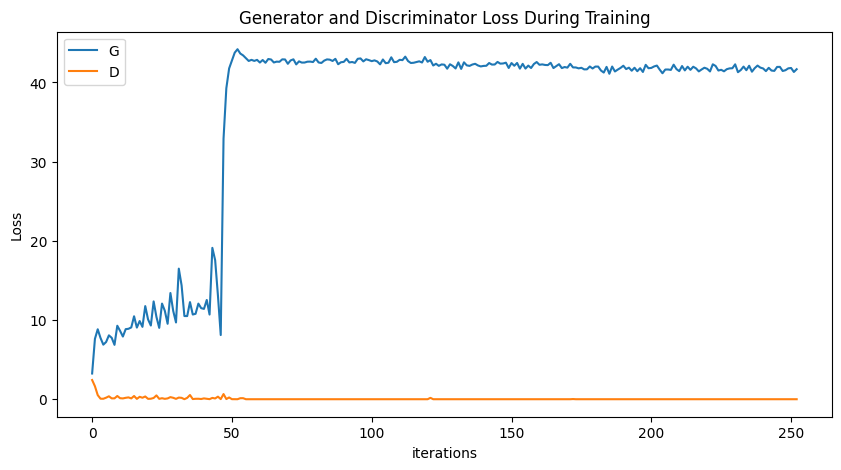

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

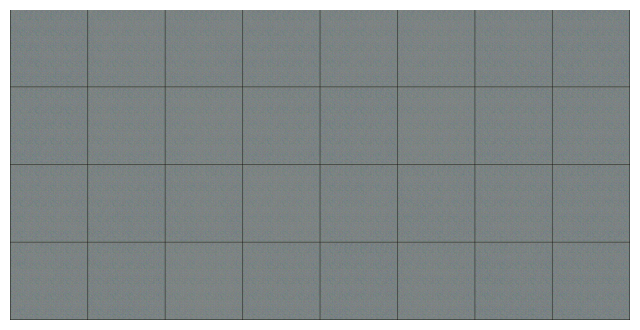

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
len(img_list)

6

In [ ]:
fixed_noise = torch.randn(32, nz, 1, 1, device=device)
netG(fixed_noise)[0, :, :, :]

tensor([[[-0.0523, -0.0238, -0.0358,  ..., -0.0024, -0.0092,  0.0192],
         [ 0.0176, -0.0767, -0.1744,  ...,  0.0217, -0.2343,  0.0229],
         [-0.0277, -0.0412, -0.1403,  ..., -0.1933, -0.1741, -0.1110],
         ...,
         [-0.0564,  0.0881, -0.2098,  ...,  0.0485, -0.2032,  0.0297],
         [ 0.0590, -0.1211, -0.0355,  ..., -0.1086, -0.0462, -0.0425],
         [-0.0378,  0.0343, -0.0544,  ...,  0.0216, -0.1162,  0.0633]],

        [[-0.0548, -0.0384, -0.0811,  ..., -0.0836, -0.1058, -0.0841],
         [-0.0810, -0.1101,  0.1087,  ..., -0.0779,  0.0773,  0.0713],
         [-0.0063, -0.0781, -0.1641,  ..., -0.0971, -0.0838,  0.0741],
         ...,
         [ 0.0444, -0.0321,  0.2042,  ...,  0.0293,  0.1385,  0.0265],
         [ 0.0290, -0.0680,  0.0345,  ..., -0.1128, -0.1140, -0.0947],
         [ 0.0313, -0.1223, -0.0431,  ..., -0.0182,  0.0475,  0.0300]],

        [[-0.0367, -0.0507, -0.0346,  ..., -0.0701,  0.0558, -0.0505],
         [-0.0377, -0.2160, -0.1365,  ..., -0

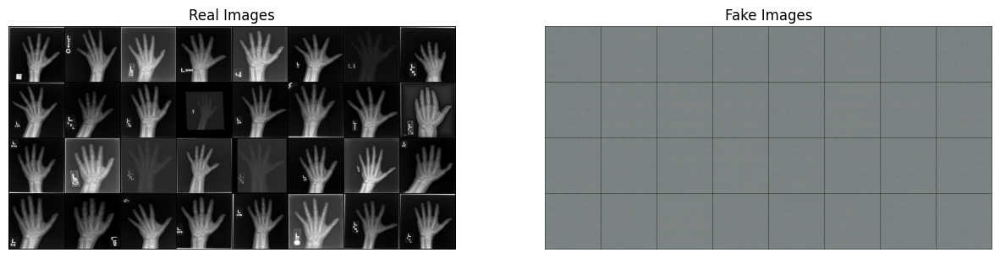

In [ ]:
# Grab a batch of real images from the train_loader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1], (1,2,0)))
plt.show()

## EBGAN

### Generator

Following:
- https://github.com/ragvri/Fundus_image_generation/blob/master/pytorch/dcgan.py

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(
                in_channels = nz,       # nz = 100
                out_channels = ngf*16,  # ngf = 32
                kernel_size = 5,
                stride = 1,
                padding = 0,
                bias = False
            ),
            # out: [batch_size, 512, 5, 5]
            nn.BatchNorm2d(ngf*16),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*16, ngf*8, 5, 3, 1, bias=False),
            # out: [batch_size, 256, 15, 15]
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*8, ngf*4, 5, 3, 1, bias=False),
            # out: [batch_size, 128, 45, 45]
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            # out: [batch_size, 64, 90, 90]
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*2, ngf*1, 4, 2, 1, bias=False),
            # out: [batch_size, 32, 180, 180]
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            # out: [batch_size, 3, 360, 360]
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
# print(netG)
print("out:", netG(torch.randn(32, 100, 1, 1, device=device)).size())

out: torch.Size([32, 3, 360, 360])


### Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input: [32, 3, 360, 360]
            nn.Conv2d(
                in_channels=nc,     # nc = 3
                out_channels=ndf,   # ndf = 32
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            # out: [32, 32, 180, 180]
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            # out: [32, 64, 90, 90]
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 64, 4, 2, 1, bias=False),
            # out: [32, 64, 45, 45]
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 5, 3, 1, bias=False),
            # out: [32, 128, 15, 15]
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 128, 5, 3, 1, bias=False),
            # out: [32, 128, 5, 5]
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, 5, 3, 0, bias=False), # out_channels = 1 to determine real/fake
            # out: [32, 1, 1, 1]
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
# print(netD)
print(netD(torch.randn(32, 3, 360, 360, device=device)).size())

torch.Size([32, 1, 1, 1])


In [ ]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(32, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
print("lr:", lr)
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# optimizerD = optim.SGD(netD.parameters(), lr=lr)
# optimizerD = optim.SGD(netG.parameters(), lr=lr)

lr: 0.0002


In [ ]:
schedulerD = optim.lr_scheduler.CosineAnnealingLR(optimizerD, len(train_loader))
schedulerG = optim.lr_scheduler.CosineAnnealingLR(optimizerG, len(train_loader))

### Energy Function

In [ ]:
# Energy function: Mean Squared Error
def mse_energy(real_samples, fake_samples):
    return torch.mean((real_samples - fake_samples)**2)

# Energy function: Contrastive Divergence (CD)
def cd_energy(real_samples, fake_samples, cd_steps=1):
    # Perform Gibbs sampling
    for _ in range(cd_steps):
        h_prob = torch.sigmoid(torch.matmul(fake_samples, W) + b)
        h_samples = (torch.rand_like(h_prob) < h_prob).float()
        v_prob = torch.sigmoid(torch.matmul(h_samples, W.t()) + c)
        fake_samples = (torch.rand_like(v_prob) < v_prob).float()

    # Compute energy as the difference in model distribution
    return torch.mean((real_samples - fake_samples)**2)

# Energy function: Noise-Contrastive Estimation (NCE)
def nce_energy(real_samples, fake_samples, noise_samples, discriminator):
    logits = discriminator(fake_samples)
    noise_logits = discriminator(noise_samples)
    return -torch.mean(torch.log(torch.sigmoid(logits))) - torch.mean(torch.log(1 - torch.sigmoid(noise_logits)))

# Energy function: Noise-Constrained Autoencoder (NCAE)
def ncae_energy(real_samples, fake_samples, noise_std=0.1):
    noise = torch.randn_like(fake_samples) * noise_std
    noisy_samples = fake_samples + noise
    reconstruction_loss = torch.mean((real_samples - noisy_samples)**2)
    return reconstruction_loss

# Energy function: Adversarial Contrastive Estimation (ACE)
def ace_energy(real_samples, fake_samples, discriminator):
    logits = discriminator(fake_samples)
    return -torch.mean(torch.log(torch.sigmoid(logits)))

### Training Loop

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the train_loader
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_data = data[0].to(device)
        bs = real_data.size()[0] # use this because batch_size is different on last iter

        label = torch.full((bs,), real_label, dtype=torch.float, device=device)
        output = netD(real_data).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(bs, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update Discriminator
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        noise = torch.randn(bs, nz, 1, 1, device=device)
        fake_samples = netG(noise)
        fake_output = netD(fake_samples.detach()).view(-1)
        errG = mse_energy(real_data, fake_samples)
        # Calculate gradients for G
        errG.backward()

        D_G_z2 = fake_output.mean().item()
        # Update Generator
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 50 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

    schedulerD.step()
    schedulerG.step()

Starting Training Loop...
[0/10][0/110]	Loss_D: 2.0205	Loss_G: 0.5553	D(x): 0.2926	D(G(z)): 0.4604 / 0.3221
[0/10][50/110]	Loss_D: 0.0038	Loss_G: 0.1802	D(x): 0.9974	D(G(z)): 0.0012 / 0.0009
[0/10][100/110]	Loss_D: 0.0025	Loss_G: 0.0954	D(x): 0.9983	D(G(z)): 0.0008 / 0.0010
[1/10][0/110]	Loss_D: 0.0046	Loss_G: 0.0917	D(x): 0.9962	D(G(z)): 0.0008 / 0.0010
[1/10][50/110]	Loss_D: 0.0029	Loss_G: 0.1183	D(x): 0.9975	D(G(z)): 0.0003 / 0.0003
[1/10][100/110]	Loss_D: 0.0013	Loss_G: 0.1102	D(x): 0.9990	D(G(z)): 0.0003 / 0.0003
[2/10][0/110]	Loss_D: 0.0015	Loss_G: 0.1076	D(x): 0.9990	D(G(z)): 0.0004 / 0.0003
[2/10][50/110]	Loss_D: 0.0007	Loss_G: 0.0794	D(x): 0.9994	D(G(z)): 0.0001 / 0.0001
[2/10][100/110]	Loss_D: 0.0005	Loss_G: 0.0861	D(x): 0.9997	D(G(z)): 0.0002 / 0.0001
[3/10][0/110]	Loss_D: 0.0005	Loss_G: 0.0903	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[3/10][50/110]	Loss_D: 0.0003	Loss_G: 0.1013	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[3/10][100/110]	Loss_D: 0.0002	Loss_G: 0.0951	D(x): 0.9998	D(G

### Result

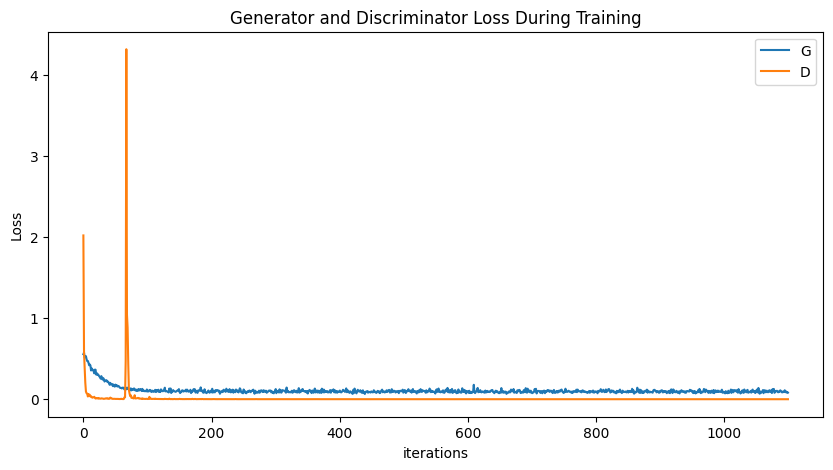

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

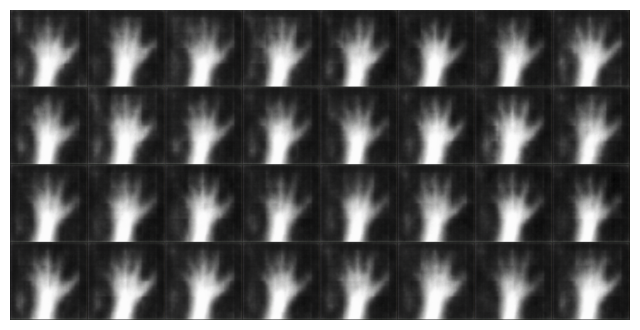

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
fixed_noise = torch.randn(32, nz, 1, 1, device=device)
netG(fixed_noise)[0, :, :, :]

tensor([[[-0.2700, -0.4476, -0.4342,  ..., -0.5093, -0.5521, -0.3053],
         [-0.4876, -0.5770, -0.7686,  ..., -0.7713, -0.6890, -0.5715],
         [-0.5795, -0.5939, -0.7461,  ..., -0.6296, -0.6661, -0.4838],
         ...,
         [-0.4883, -0.6607, -0.6097,  ..., -0.5992, -0.6163, -0.4820],
         [-0.4262, -0.6133, -0.5371,  ..., -0.6698, -0.6156, -0.4659],
         [-0.2905, -0.5404, -0.4989,  ..., -0.5378, -0.4045, -0.2176]],

        [[-0.0792, -0.4903, -0.4720,  ..., -0.4781, -0.4394, -0.1423],
         [-0.5909, -0.7550, -0.7037,  ..., -0.6884, -0.7317, -0.4929],
         [-0.5854, -0.6965, -0.7277,  ..., -0.6867, -0.7427, -0.5760],
         ...,
         [-0.4494, -0.5720, -0.6772,  ..., -0.6004, -0.5667, -0.4469],
         [-0.4753, -0.5788, -0.6111,  ..., -0.5432, -0.6083, -0.4584],
         [-0.2745, -0.4953, -0.5066,  ..., -0.4738, -0.4195, -0.2159]],

        [[-0.2132, -0.4719, -0.5521,  ..., -0.5483, -0.4872, -0.2500],
         [-0.5882, -0.6755, -0.5799,  ..., -0

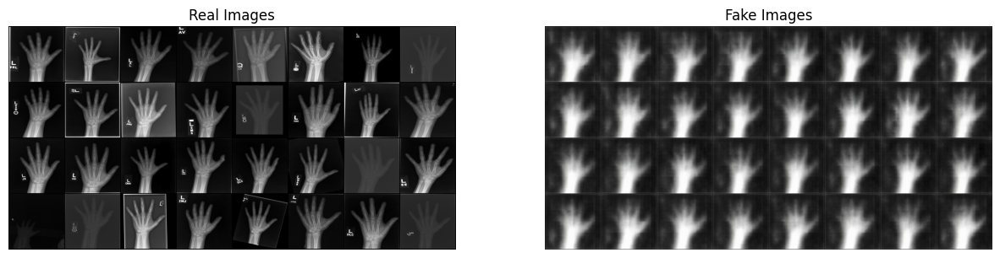

In [ ]:
# Grab a batch of real images from the train_loader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1], (1,2,0)))
plt.show()

## Takeaways

- sepertinya butuh data banyak (?)
- what if both the generator and discriminator are good?